In [24]:
using QuantumDynamics
using Plots
using LinearAlgebra

Hoping to get rid of the units issue by integrating Unitful into QuantumDynamics package.

In [25]:
const thz2au = 0.0001519828500716
const invcm2au = 4.55633e-6
const au2fs = 0.02418884254
const mev2invcm = 8.066
const mev2au = mev2invcm * invcm2au
const nm2au = 18.897

18.897

In [26]:
N = 5

5

In [27]:
    H0 = Matrix{ComplexF64}([
        4.144 0.026 0.109 -0.092 0.000
        0.026 4.070 0.090 -0.112 0.000
        0.109 0.090 4.509 0.000 0.070
        -0.092 -0.112 0.000 4.992 0.087
        0.000 0.000 0.070 0.087 4.065 
    ]) * 1000 * mev2au

5×5 Matrix{ComplexF64}:
    0.152298+0.0im  0.000955535+0.0im  …  -0.00338112+0.0im         0.0+0.0im
 0.000955535+0.0im     0.149578+0.0im     -0.00411615+0.0im         0.0+0.0im
   0.0040059+0.0im   0.00330762+0.0im             0.0+0.0im   0.0025726+0.0im
 -0.00338112+0.0im  -0.00411615+0.0im        0.183463+0.0im  0.00319737+0.0im
         0.0+0.0im          0.0+0.0im      0.00319737+0.0im    0.149394+0.0im

In [28]:
show(stdout, "text/plain", real.(H0))

5×5 Matrix{Float64}:
  0.152298      0.000955535  0.0040059   -0.00338112  0.0
  0.000955535   0.149578     0.00330762  -0.00411615  0.0
  0.0040059     0.00330762   0.165712     0.0         0.0025726
 -0.00338112   -0.00411615   0.0          0.183463    0.00319737
  0.0           0.0          0.0025726    0.00319737  0.149394

In [29]:
dt = 0.1/au2fs 

4.134137457575099

In [30]:
nsteps = 30000
ρ0 = Matrix{ComplexF64}(zeros(N, N))
ρ0[1, 1] = 1.0

T = 50.0:50.0:500.0

β = 1 / (T[6] * 3.16683e-6) # T = 300K

1052.5772881188234

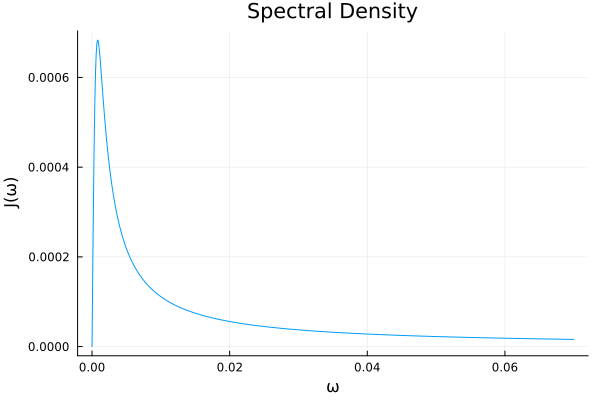

In [31]:
Jw2 = SpectralDensities.DrudeLorentz(λ=150*invcm2au, γ=180*invcm2au, Δs=1.0)
ω = 0:0.0001:0.07
ωs2, cs2 = SpectralDensities.discretize(Jw2, 100)
plot(ω, Jw2.(ω), xlabel="ω", ylabel="J(ω)", title="Spectral Density", legend=false)

In [9]:
using DelimitedFiles
open("Jw_1.txt", "w") do io
    writedlm(io, [ω  Jw2.(ω)], ' ')
end

In [20]:
fbU = Propagators.calculate_bare_propagators(; Hamiltonian=H0, dt, ntimes=nsteps)
tquapi, ρquapi = QuAPI.propagate(; 
                                fbU=fbU, 
                                Jw=[Jw2],
                                β=β,
                                ρ0=ρ0,
                                dt,
                                ntimes=nsteps,
                                svec=[1.0 2.0 3.0 4.0 5.0],
                                kmax=3,
                                verbose=true)

[ Info: Starting propagation within memory
[ Info: Step = 1, #paths = 1
[ Info: Step = 2, #paths = 25
[ Info: Step = 3, #paths = 625
[ Info: Starting iteration
[ Info: Step = 4, #paths = 15625
[ Info: Step = 5, #paths = 390625
[ Info: Step = 6, #paths = 390625
[ Info: Step = 7, #paths = 390625
[ Info: Step = 8, #paths = 390625
[ Info: Step = 9, #paths = 390625
[ Info: Step = 10, #paths = 390625
[ Info: Step = 11, #paths = 390625
[ Info: Step = 12, #paths = 390625
[ Info: Step = 13, #paths = 390625
[ Info: Step = 14, #paths = 390625
[ Info: Step = 15, #paths = 390625
[ Info: Step = 16, #paths = 390625
[ Info: Step = 17, #paths = 390625
[ Info: Step = 18, #paths = 390625
[ Info: Step = 19, #paths = 390625
[ Info: Step = 20, #paths = 390625
[ Info: Step = 21, #paths = 390625
[ Info: Step = 22, #paths = 390625
[ Info: Step = 23, #paths = 390625
[ Info: Step = 24, #paths = 390625
[ Info: Step = 25, #paths = 390625
[ Info: Step = 26, #paths = 390625
[ Info: Step = 27, #paths = 390625
[ Info:

(0.0:206.70687287875495:124024.12372725297, [1.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.7787474893095337 + 0.0im -0.075505572172527 + 0.045002889217628066im … 0.028939496746919098 + 0.05215165678302537im 0.009612602801522957 + 0.07809043811587439im; … ; 0.20972684849377957 + 3.1212206756658375e-17im 0.006025696325616897 + 0.00013922777215944978im … 0.01325955692460138 - 0.0005666089688855456im 0.02912362995426102 - 0.0020777021204692377im; 0.20967155240534566 + 5.745862979344142e-17im 0.006039271649644503 + 0.00013820087591704538im … 0.013257848066709892 - 0.0005664179100363753im 0.02911722110272712 - 0.0020775217132724486im;;; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; -0.075505572172527 - 0.045002889217628066im 0.010111972921766082 + 0.0im … 0.00022007774131957945 - 0.007123892291167895im 0.0038637130268381102 - 0.008769222495781569im; … ; 0.006025696325616889 - 0.00013922777215940628im 0.26729868936564083 + 9.273286463999531e-17im … 0.024773857226173573 - 0.0005548

In [23]:
plot(tquapi.*au2fs, real.(ρquapi[:, 1, 1]), label="LE1")
plot!(tquapi.*au2fs, real.(ρquapi[:, 2, 2]), label="LE2")
#plot!(tquapi.*au2fs, real.(ρquapi[:, 3, 3]), label="CT1")
#plot!(tquapi.*au2fs, real.(ρquapi[:, 4, 4]), label="CT2")
plot!(tquapi.*au2fs, real.(ρquapi[:, 5, 5]), label="TT")

LoadError: UndefVarError: `tquapi` not defined

In [37]:
fbU = Propagators.calculate_bare_propagators(; Hamiltonian=H0, dt=dt, ntimes=nsteps)
@time t_TTM, ρ_TTM = TTM.propagate(; fbU=fbU,
                            Jw=[Jw2],
                            β=β,
                            ρ0=ρ0,
                            dt=dt,
                            ntimes=nsteps,
                            rmax=20,
                            svec=[1.0 2.0 3.0 4.0 5.0],
                            extraargs=TEMPO.TEMPOArgs(; cutoff=1e-15, maxdim=1000),
                            path_integral_routine=TEMPO.build_augmented_propagator)

1424.378495 seconds (9.95 M allocations: 193.288 GiB, 1.12% gc time)


(0.0:4.134137457575099:124024.12372725295, ComplexF64[1.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.9995152076292669 + 5.4645943387378184e-21im -0.00022639638718899364 - 0.003941365815084517im … 0.00122701663195909 + 0.013908541669936655im 4.129461604051493e-6 - 2.5120393124362526e-6im; … ; 0.44305747680117746 - 1.798079240912958e-10im -0.02702941068281409 + 0.0016698685085489288im … 0.03804647103495248 + 5.123040488498998e-5im 0.0032665450631212465 + 0.0003993323024580713im; 0.4430546266511889 - 1.7981185274157322e-10im -0.02702897188803922 + 0.0016698530038321497im … 0.038046319772850286 + 5.12308897470239e-5im 0.00326650017297552 + 0.00039932436262491274im;;; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; -0.00022639638718901438 + 0.003941365815084515im 1.559338894568432e-5 - 1.4907779871675686e-19im … -5.5125389824514165e-5 + 1.688164298324417e-6im 8.97080192578979e-9 + 1.685351191532177e-8im; … ; -0.027029410681865235 - 0.0016698684496882798im 0.12863092774012932 + 3.23

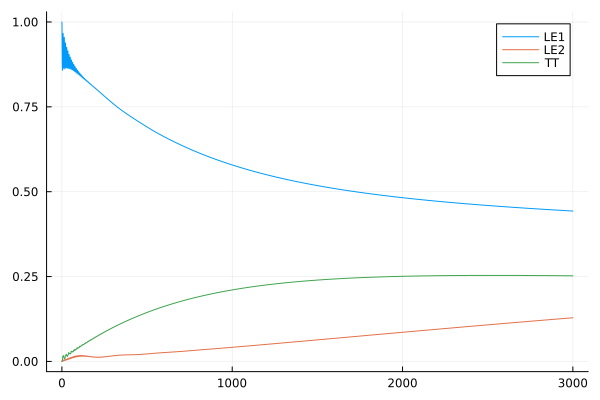

In [38]:
plot(t_TTM.*au2fs, real.(ρ_TTM[:, 1, 1]), label="LE1")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:, 2, 2]), label="LE2")
#plot!(t_TTM.*au2fs, real.(ρ_TTM[:, 3, 3]), label="CT1")
#plot!(t_TTM.*au2fs, real.(ρ_TTM[:, 4, 4]), label="CT2")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:, 5, 5]), label="TT")

In [34]:
λs = repeat([150.0], 5) * mev2invcm * invcm2au
γs = repeat([180.0], 5) * mev2invcm * invcm2au
JwH = Vector{SpectralDensities.DrudeLorentz}()
sys_ops = Vector{Matrix{ComplexF64}}()
for (j, (λ, γ)) in enumerate(zip(λs, γs))
    push!(JwH, SpectralDensities.DrudeLorentz(; λ, γ, Δs=1.0))
    op = zeros(5, 5)
    op[j, j] = 1.0
    push!(sys_ops, op)
end
 
nsteps = 30000
ρ0 = Matrix{ComplexF64}(zeros(N, N))
ρ0[1, 1] = 1.0

T = 50.0:50.0:500.0

β = 1 / (300 * 3.16683e-6) # T = 300K

dt = 0.1/au2fs

4.134137457575099

In [35]:
@time times_HEOM, ρs_HEOM = HEOM.propagate(; Hamiltonian=H0, ρ0, β, dt, ntimes=nsteps, Jw=JwH, sys_ops=sys_ops, num_modes=2, Lmax=3)

837.011636 seconds (4.99 G allocations: 666.654 GiB, 10.26% gc time, 1.16% compilation time)


([0.0, 4.134137457575099, 8.268274915150197, 12.402412372725296, 16.536549830300395, 20.670687287875495, 24.804824745450595, 28.93896220302569, 33.07309966060079, 37.20723711817589  …  123986.91649013478, 123991.05062759235, 123995.18476504993, 123999.31890250751, 124003.45303996508, 124007.58717742265, 124011.72131488023, 124015.85545233781, 124019.98958979538, 124024.12372725295], ComplexF64[1.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.9995175447484308 + 0.0im -0.00020847885413014382 - 0.003913220475268908im … 0.0009261139307636881 + 0.013829482226124228im 4.17104518606924e-6 - 2.3459498866159816e-6im; … ; 0.24274883950586687 + 0.0im -0.004347560924093953 + 0.0024649379739692906im … 0.014699353607952678 - 0.0009172809556756621im 0.010885992112369722 + 0.009181165195550964im; 0.24274883732090508 + 0.0im -0.004347560803115707 + 0.002464937981849748im … 0.0146993534554431 - 0.0009172809454797376im 0.010885992220751818 + 0.009181165058421965im;;; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0

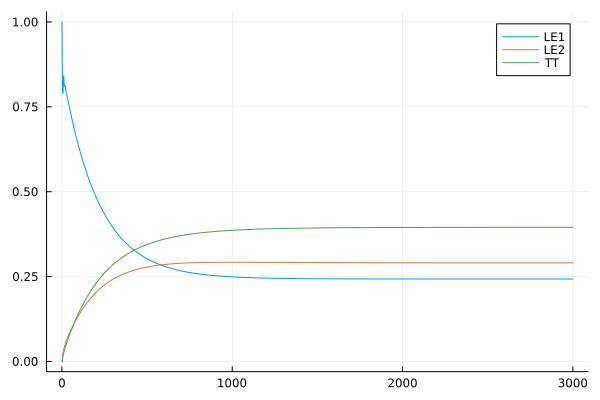

In [36]:
plot(times_HEOM.*au2fs, real.(ρs_HEOM[:, 1, 1]), label="LE1")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 2, 2]), label="LE2")
#plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 3, 3]), label="CT1")
#plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 4, 4]), label="CT2")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 5, 5]), label="TT")

In [47]:
@time times_BRME, ρs_BRME = BlochRedfield.propagate(;
                                            Hamiltonian=H0,
                                            Jw=JwH,
                                            β,
                                            ρ0,
                                            dt=dt,
                                            ntimes=nsteps,
                                            sys_ops)

  4.260926 seconds (102.94 M allocations: 3.241 GiB, 7.33% gc time)


([0.0, 4.134137457575099, 8.268274915150197, 12.402412372725296, 16.536549830300395, 20.670687287875495, 24.804824745450595, 28.93896220302569, 33.07309966060079, 37.20723711817589  …  123986.91649013478, 123991.05062759235, 123995.18476504993, 123999.31890250751, 124003.45303996508, 124007.58717742265, 124011.72131488023, 124015.85545233781, 124019.98958979538, 124024.12372725295], ComplexF64[1.0000000000000002 + 0.0im 1.192980762210107e-17 + 0.0im … -3.036739781072923e-17 + 0.0im 3.870150756848078e-18 + 0.0im; 0.9953826197030513 - 1.2733512758575304e-17im 0.006096532027663948 - 0.003869350687848259im … 0.0025761981980395414 + 0.013813013295137769im -0.0005286275004218846 - 5.585434146687723e-7im; … ; 0.043679303829309034 + 1.92026120102905e-13im 0.03817259021533656 + 1.9718796280851491e-10im … 0.004758883186658381 + 2.26537296464855e-10im 0.0455611499637326 + 8.138877261255699e-11im; 0.043679303822410316 + 3.702943967110212e-13im 0.038172590176746214 + 2.0296311802324537e-10im … 0.00

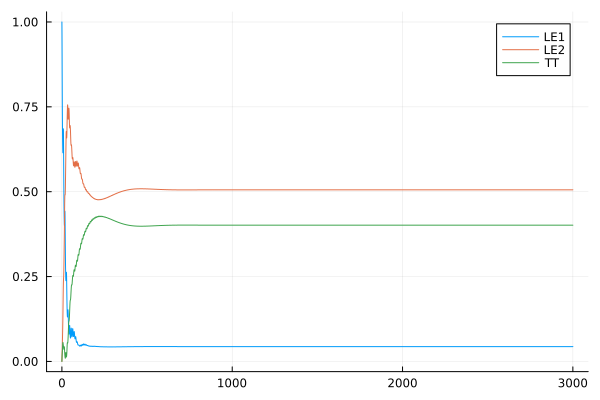

In [48]:
plot(times_BRME.*au2fs, real.(ρs_BRME[:, 1, 1]), label="LE1")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 2, 2]), label="LE2")
#plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 3, 3]), label="CT1")
#plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 4, 4]), label="CT2")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 5, 5]), label="TT")

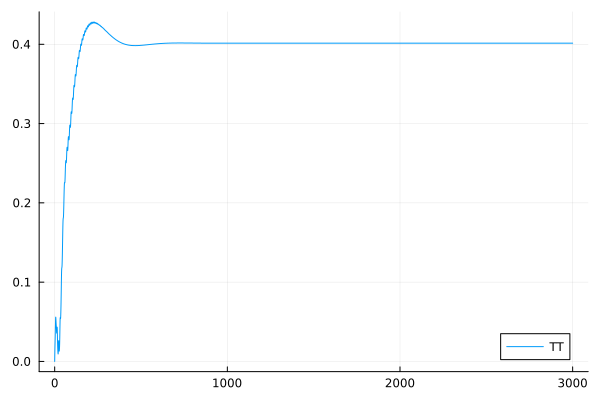

In [21]:
plot(times_BRME.*au2fs, real.(ρs_BRME[:, 5, 5]), label="TT")